In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import vgg19

In [3]:
content_image_path = "/content/drive/MyDrive/Images/cat.jpg"
style_reference_image_path = "/content/drive/MyDrive/Images/pexels-steve-1183992.jpg"
# name of the generated image
result_prefix = "generated_image"


In [4]:
# Weights of the different loss components
total_variation_weight = 1e-6
style_weight = 1e-6
content_weight = 2.5e-8


In [6]:
# Dimensions of the generated picture.
width, height = keras.preprocessing.image.load_img(content_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

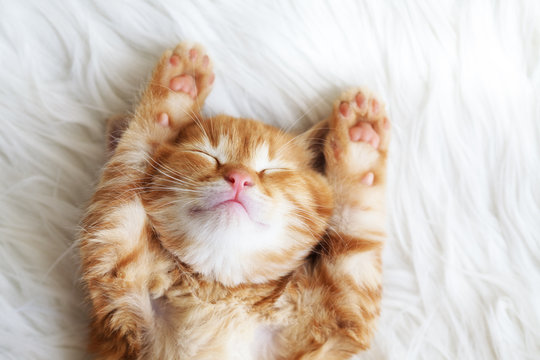

In [8]:
from IPython.display import Image, display

display(Image(content_image_path))

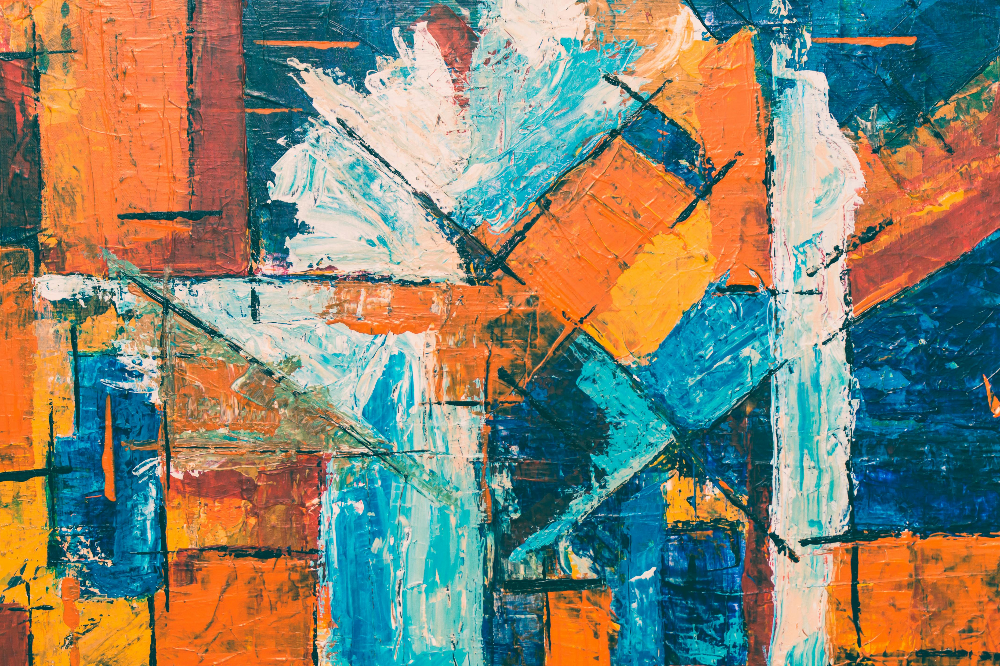

In [9]:
display(Image(style_reference_image_path))

In [10]:
def preprocess_image(image_path):
    # Util function to open, resize and format pictures into appropriate tensors
    img = keras.preprocessing.image.load_img(
        image_path, target_size=(img_nrows, img_ncols)
    )
    img = keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return tf.convert_to_tensor(img)

In [11]:
def deprocess_image(x):
    # Util function to convert a tensor into a valid image
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

In [12]:
# The gram matrix of an image tensor (feature-wise outer product)


def gram_matrix(x):
    x = tf.transpose(x, (2, 0, 1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    gram = tf.matmul(features, tf.transpose(features))
    return gram


In [13]:
# The "style loss" is designed to maintain
# the style of the reference image in the generated image.
# It is based on the gram matrices (which capture style) of
# feature maps from the style reference image
# and from the generated image


def style_loss(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return tf.reduce_sum(tf.square(S - C)) / (4.0 * (channels ** 2) * (size ** 2))

In [14]:
# An auxiliary loss function
# designed to maintain the "content" of the
# base image in the generated image


def content_loss(base, combination):
    return tf.reduce_sum(tf.square(combination - base))

In [15]:
# The 3rd loss function, total variation loss,
# designed to keep the generated image locally coherent


def total_variation_loss(x):
    a = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, 1:, : img_ncols - 1, :]
    )
    b = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, : img_nrows - 1, 1:, :]
    )
    return tf.reduce_sum(tf.pow(a + b, 1.25))

In [16]:
# Build a VGG19 model loaded with pre-trained ImageNet weights
model = vgg19.VGG19(weights="imagenet", include_top=False)

# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

# Set up a model that returns the activation values for every layer in
# VGG19 (as a dict).
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

80134624/80134624 [==============================] - 4s 0us/step


In [17]:
# List of layers to use for the style loss.
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]
# The layer to use for the content loss.
content_layer_name = "block5_conv2"


def compute_loss(combination_image, base_image, style_reference_image):
    input_tensor = tf.concat(
        [base_image, style_reference_image, combination_image], axis=0
    )
    features = feature_extractor(input_tensor)

    # Initialize the loss
    loss = tf.zeros(shape=())

    # Add content loss
    layer_features = features[content_layer_name]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    loss = loss + content_weight * content_loss(
        base_image_features, combination_features
    )
    # Add style loss
    for layer_name in style_layer_names:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        sl = style_loss(style_reference_features, combination_features)
        loss += (style_weight / len(style_layer_names)) * sl

    # Add total variation loss
    loss += total_variation_weight * total_variation_loss(combination_image)
    return loss

In [18]:
@tf.function
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss = compute_loss(combination_image, base_image, style_reference_image)
    grads = tape.gradient(loss, combination_image)
    return loss, grads

In [19]:
import tensorflow as tf

# Check if GPU is being used
if tf.test.gpu_device_name():
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
    print("Please install GPU version of TF")

Default GPU Device: /device:GPU:0


 20%|█▉        | 999/5000 [04:24<17:50,  3.74it/s]

Iteration 1000: loss=3958.56


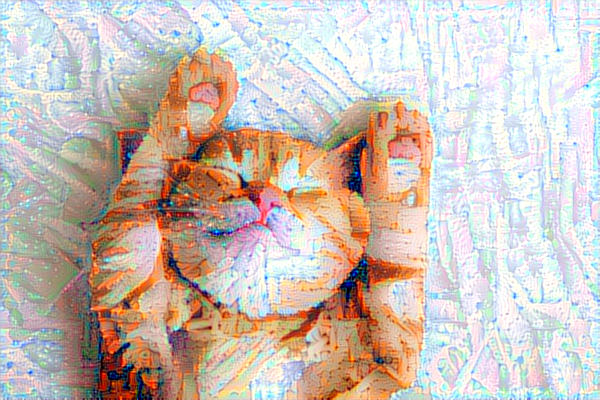

 40%|███▉      | 1999/5000 [08:51<13:20,  3.75it/s]

Iteration 2000: loss=3581.18


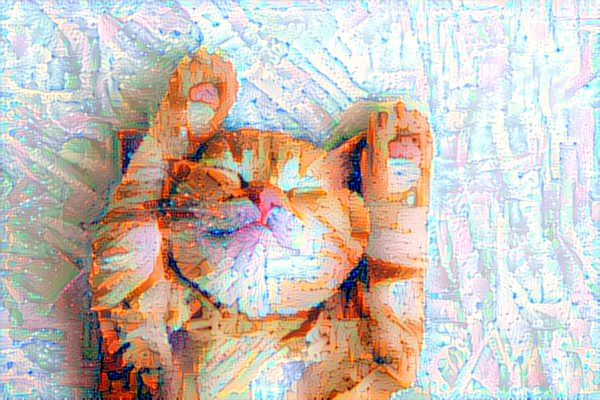

 60%|█████▉    | 2999/5000 [13:17<08:51,  3.76it/s]

Iteration 3000: loss=3428.42


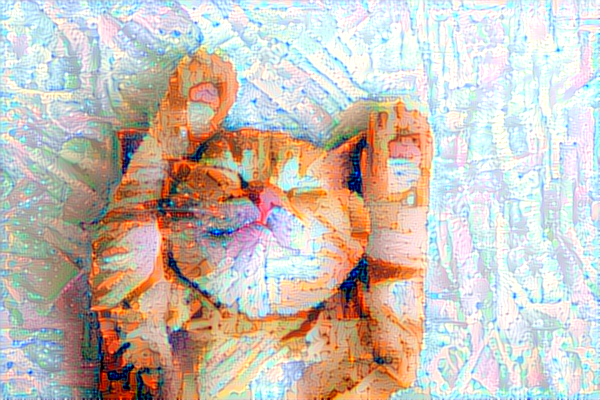

 80%|███████▉  | 3999/5000 [17:44<04:28,  3.73it/s]

Iteration 4000: loss=3348.47


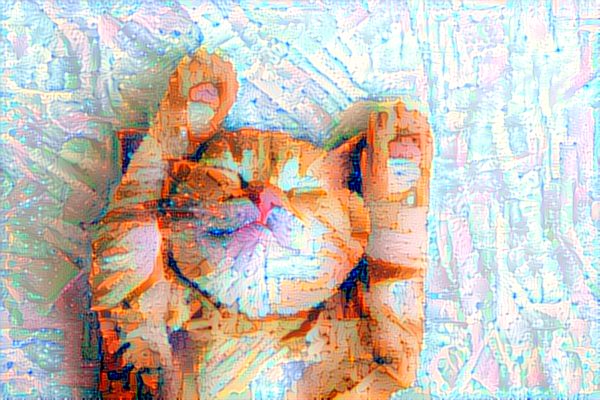

100%|█████████▉| 4999/5000 [22:11<00:00,  3.77it/s]

Iteration 5000: loss=3302.04


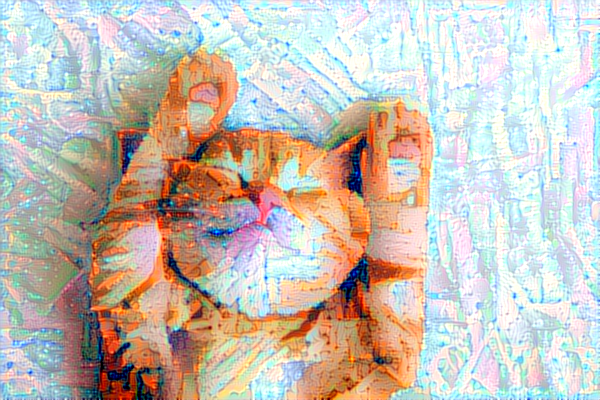

100%|██████████| 5000/5000 [22:12<00:00,  3.75it/s]


In [22]:
from tqdm import tqdm

optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96
    )
)

base_image = preprocess_image(content_image_path)
style_reference_image = preprocess_image(style_reference_image_path)
combination_image = tf.Variable(preprocess_image(content_image_path))

iterations = 5000
for i in tqdm(range(1, iterations + 1)):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    optimizer.apply_gradients([(grads, combination_image)])

    # save image after every 1000 steps
    if i % 1000 == 0:
        print("Iteration %d: loss=%.2f" % (i, loss))
        img = deprocess_image(combination_image.numpy())
        fname = result_prefix + "_at_iteration_%d.png" % i
        keras.preprocessing.image.save_img(fname, img)
        display(Image(fname))

# Fast Neural Style Transfer

In [2]:

import functools
import os
from matplotlib import gridspec
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub

print("TF Version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)
print("Eager mode enabled: ", tf.executing_eagerly())
print("GPU available: ", tf.config.list_physical_devices('GPU'))

TF Version:  2.15.0
TF Hub version:  0.16.1
Eager mode enabled:  True
GPU available:  []


In [4]:

content_image_path = "/content/drive/MyDrive/Images/cat.jpg"
style_image_path = "/content/drive/MyDrive/Images/pexels-steve-1183992.jpg"

# Load content and style images (see example in the attached colab).
content_image = plt.imread(content_image_path)
style_image = plt.imread(style_image_path)

# saving the original images in another var,so that we can compare at the end.
content_image_ = plt.imread(content_image_path)
style_image_ = plt.imread(style_image_path)

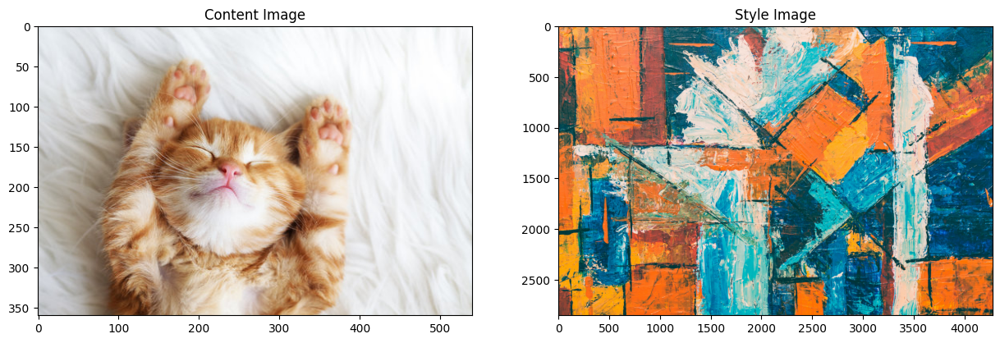

In [5]:

plt.figure(figsize=(15,15))

# displaying the content image
plt.subplot(1,2,1)
plt.imshow(content_image)
plt.title("Content Image")

# displaying the style image
plt.subplot(1,2,2)
plt.imshow(style_image)
plt.title("Style Image")

plt.show()

In [6]:

# Convert to float32 numpy array, add batch dimension, and normalize to range [0, 1]. Example using numpy:
content_image = content_image.astype(np.float32)[np.newaxis, ...] / 255.
style_image = style_image.astype(np.float32)[np.newaxis, ...] / 255.
# Optionally resize the images. It is recommended that the style image is about
# 256 pixels (this size was used when training the style transfer network).
# The content image can be any size.
style_image = tf.image.resize(style_image, (256, 256))

In [7]:
# Load image stylization model from TF hub
hub_module = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')


In [8]:

# Stylize image.
outputs = hub_module(tf.constant(content_image), tf.constant(style_image))
stylized_image = outputs[0]

In [9]:
# shape of stylized_image
stylized_image.shape

TensorShape([1, 360, 540, 3])

In [10]:

stylized_image = np.array(stylized_image)

# reshape the stylized image
stylized_image = stylized_image.reshape(stylized_image.shape[1],stylized_image.shape[2],stylized_image.shape[3])

stylized_image.shape

(360, 540, 3)

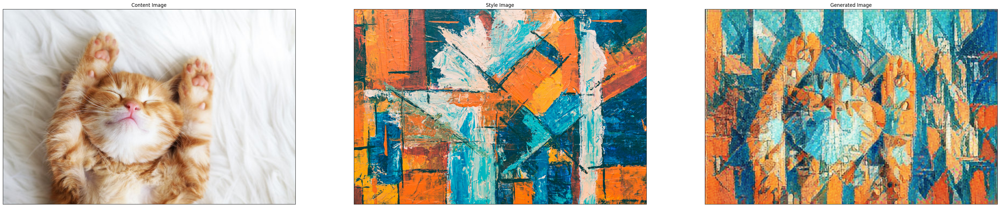

In [16]:
# plotting all 3 images side by side.

plt.figure(figsize=(45,60))

# displaying the content image
plt.subplot(1,3,1)
plt.imshow(content_image_)
plt.title("Content Image")
plt.tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)

# displaying the style image
plt.subplot(1,3,2)
plt.imshow(style_image_)
plt.title("Style Image")
plt.tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)

# displaying the stylized image
plt.subplot(1,3,3)
plt.imshow(stylized_image)
plt.title("Generated Image")
plt.tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)

# Saving the figure.
plt.savefig("Gen Img",transparent=True)
plt.show()